In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.10 pynndescent==0.5.6


In [3]:
results_file = 'write/pbmc3k.h5ad'  # the file that will store the analysis results

Data was downloaded from https://www.science.org/doi/10.1126/science.aat1699

In [4]:
adata = sc.read_10x_mtx(
    '../data/aat1699_DataS1/',  # the directory with the `.mtx` file
    var_names='gene_symbols',   # use gene symbols for the variable names (variables-axis index)
    cache=True)                 # write a cache file for faster subsequent reading

... reading from cache file cache/..-data-aat1699_DataS1-matrix.h5ad


In [5]:
adata.var_names_make_unique()  # this is u'nnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [6]:
adata

AnnData object with n_obs × n_vars = 125139 × 33694
    var: 'gene_ids'

In [8]:
meta = pd.read_csv('../support/cell_annotations.csv', sep=";").set_index('DropletID')
meta = meta.loc[adata.obs.index.intersection(meta.index)]
meta.Compartment.unique()
adata.obs = adata.obs.merge(meta, left_index=True, right_index=True)

In [9]:
adata = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & (np.array(["RCC1" in i for i in list(adata.obs.Source)]) | np.array(["RCC2" in i for i in list(adata.obs.Source)]))]

normalizing counts per cell


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


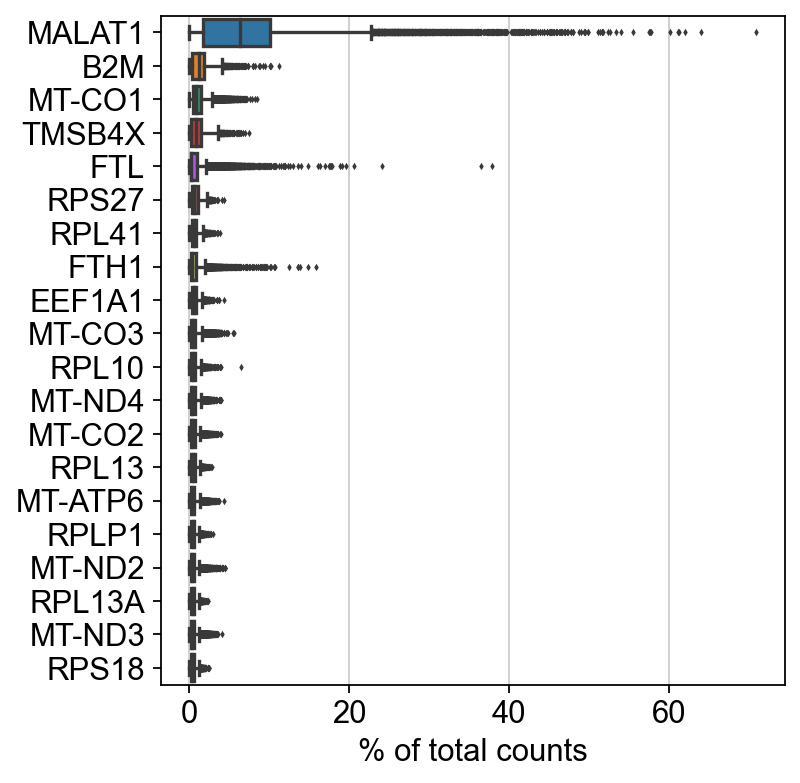

In [10]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [11]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 9488 genes that are detected in less than 3 cells


In [12]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

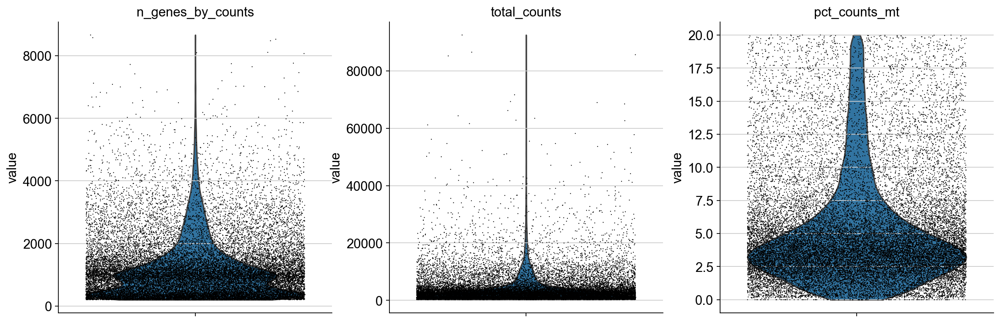

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

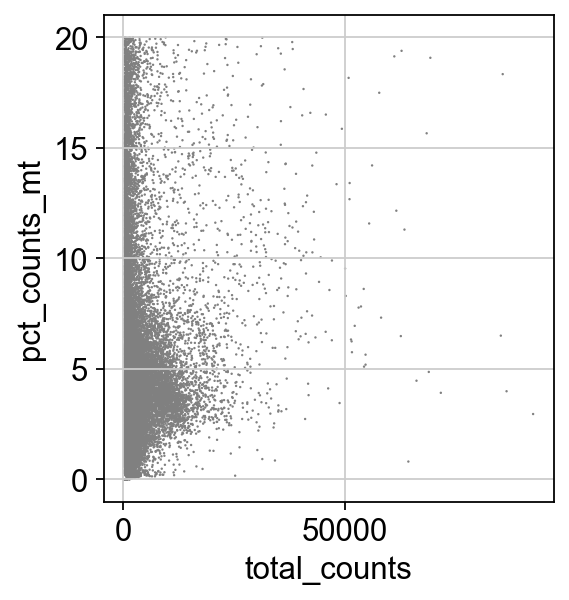

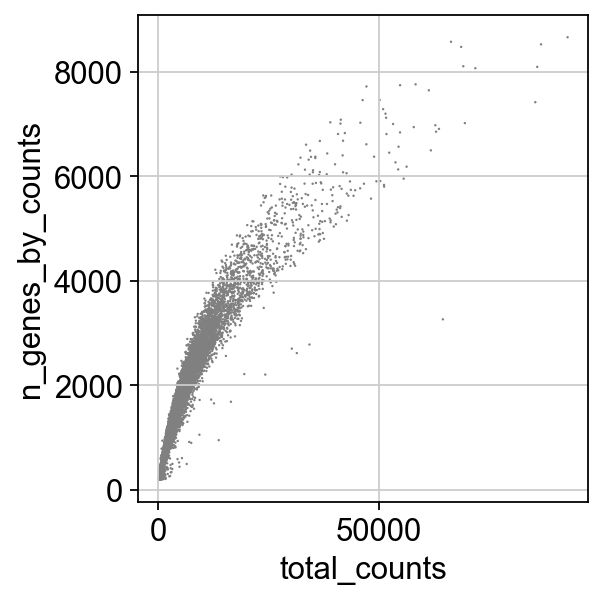

In [14]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [15]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [16]:
adata.layers['counts'] = adata.X

In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [18]:
sc.pp.log1p(adata)

In [19]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


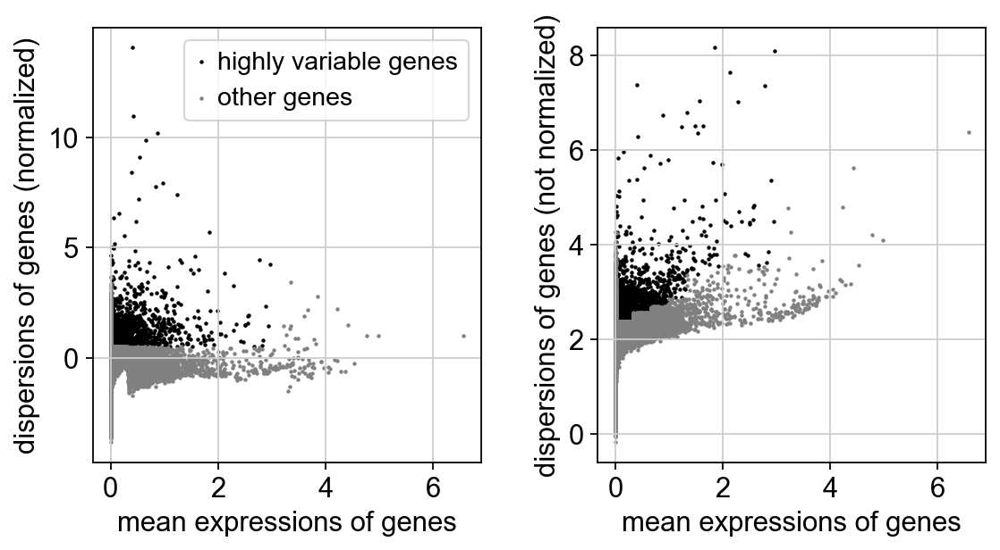

In [20]:
sc.pl.highly_variable_genes(adata)

In [21]:
adata.raw = adata

In [22]:
adata = adata[:, adata.var.highly_variable]

In [23]:
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [24]:
sc.pp.scale(adata, max_value=10)

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [25]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


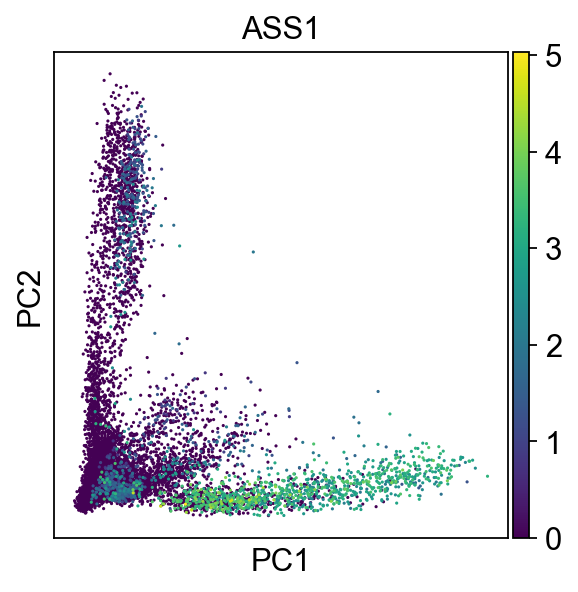

In [26]:
sc.pl.pca(adata, color='ASS1')

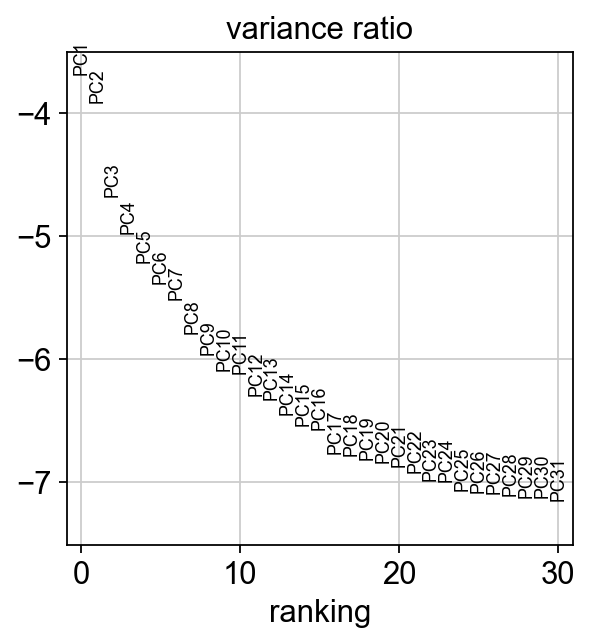

In [27]:
sc.pl.pca_variance_ratio(adata, log=True)

In [28]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)


In [29]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


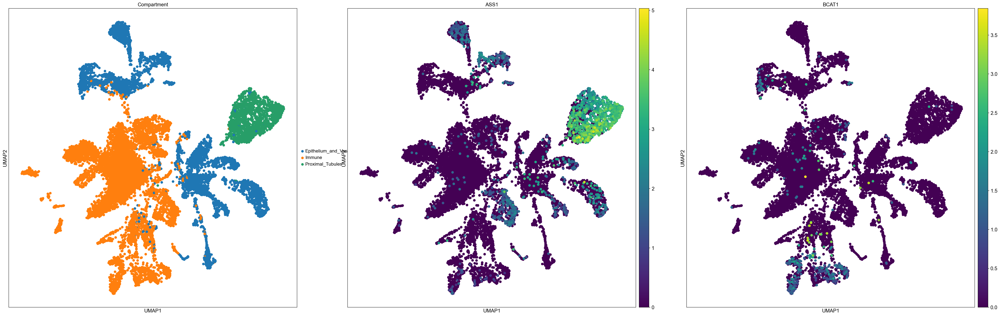

In [79]:
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata, color=['Compartment', 'ASS1','BCAT1'], size=200)

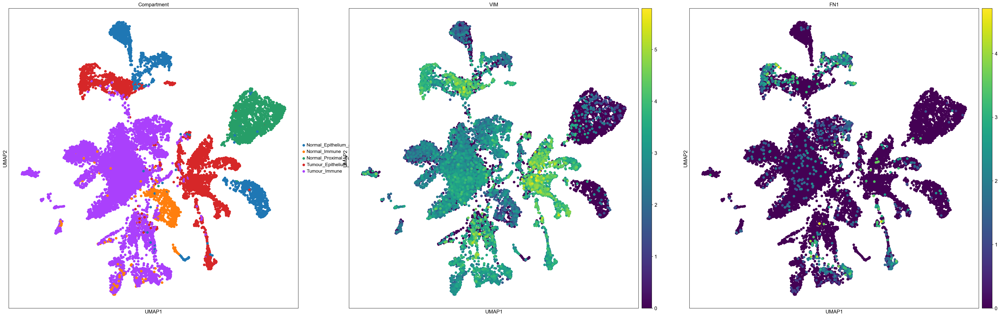

In [35]:
sc.pl.umap(adata, color=['Compartment','VIM','EPAS1'], size=200)

In [37]:
list(adata.obs.Source.unique())

['RCC2_Kid_N_ldc_1_1',
 'RCC2_Kid_N_ldc_1_2',
 'RCC2_Kid_N_ldc_1_3',
 'RCC2_Kid_T_ldc_1_1',
 'RCC2_Kid_T_ldc_1_2',
 'RCC2_Kid_T_ldc_2_1',
 'RCC2_Kid_T_ldc_2_2',
 'RCC1_Kid_N_ldc_1_1',
 'RCC1_Kid_N_ldc_1_2',
 'RCC1_Kid_N_ldc_2_1',
 'RCC1_Kid_T_ldc_1_1',
 'RCC1_Kid_T_ldc_1_2',
 'RCC1_Kid_T_ldc_2_1',
 'RCC1_Kid_T_ldc_2_2',
 'RCC1_Ure_N_ldc_1_1']

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


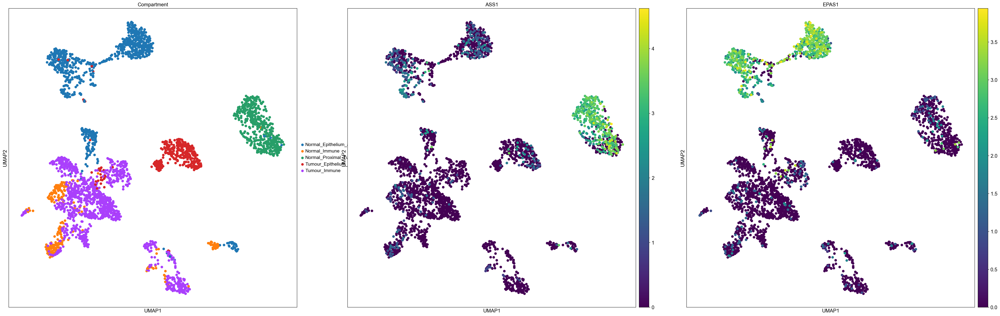

In [38]:
patient = "RCC1"
adata_filtered_patient = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & [patient in i for i in list(adata.obs.Source)]].raw.to_adata()
sc.pp.highly_variable_genes(adata_filtered_patient)
adata_filtered_patient.raw = adata_filtered_patient
adata_filtered_patient = adata_filtered_patient[:, adata_filtered_patient.var.highly_variable]
sc.pp.scale(adata_filtered_patient, max_value=10)
sc.tl.pca(adata_filtered_patient, svd_solver='arpack')
sc.pp.neighbors(adata_filtered_patient, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_filtered_patient)
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','EPAS1'], size=200)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


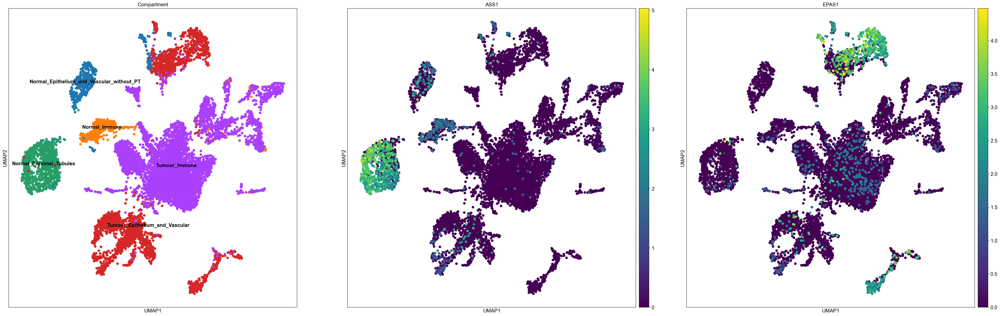

In [39]:
patient = "RCC2"
adata_filtered_patient = adata[np.isin(adata.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular','Normal_Proximal_Tubules','Normal_Immune','Tumour_Immune']) & [patient in i for i in list(adata.obs.Source)]].raw.to_adata()
sc.pp.highly_variable_genes(adata_filtered_patient)
adata_filtered_patient.raw = adata_filtered_patient
adata_filtered_patient = adata_filtered_patient[:, adata_filtered_patient.var.highly_variable]
sc.pp.scale(adata_filtered_patient, max_value=10)
sc.tl.pca(adata_filtered_patient, svd_solver='arpack')
sc.pp.neighbors(adata_filtered_patient, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_filtered_patient)
sc.set_figure_params(figsize=(15,15))
sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','EPAS1'], size=200, legend_loc='on data')

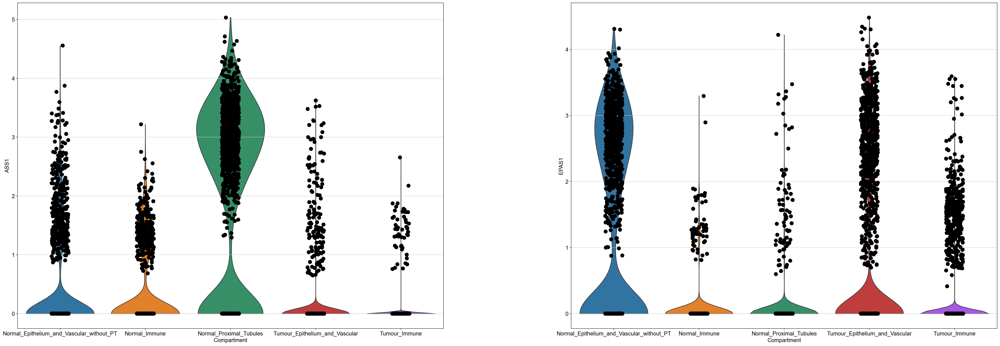

In [40]:
sc.pl.violin(adata, ['ASS1', 'EPAS1'], groupby='Compartment', size = 10)

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/seaborn/categorical.py:2805: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='gene', ylabel='value'>

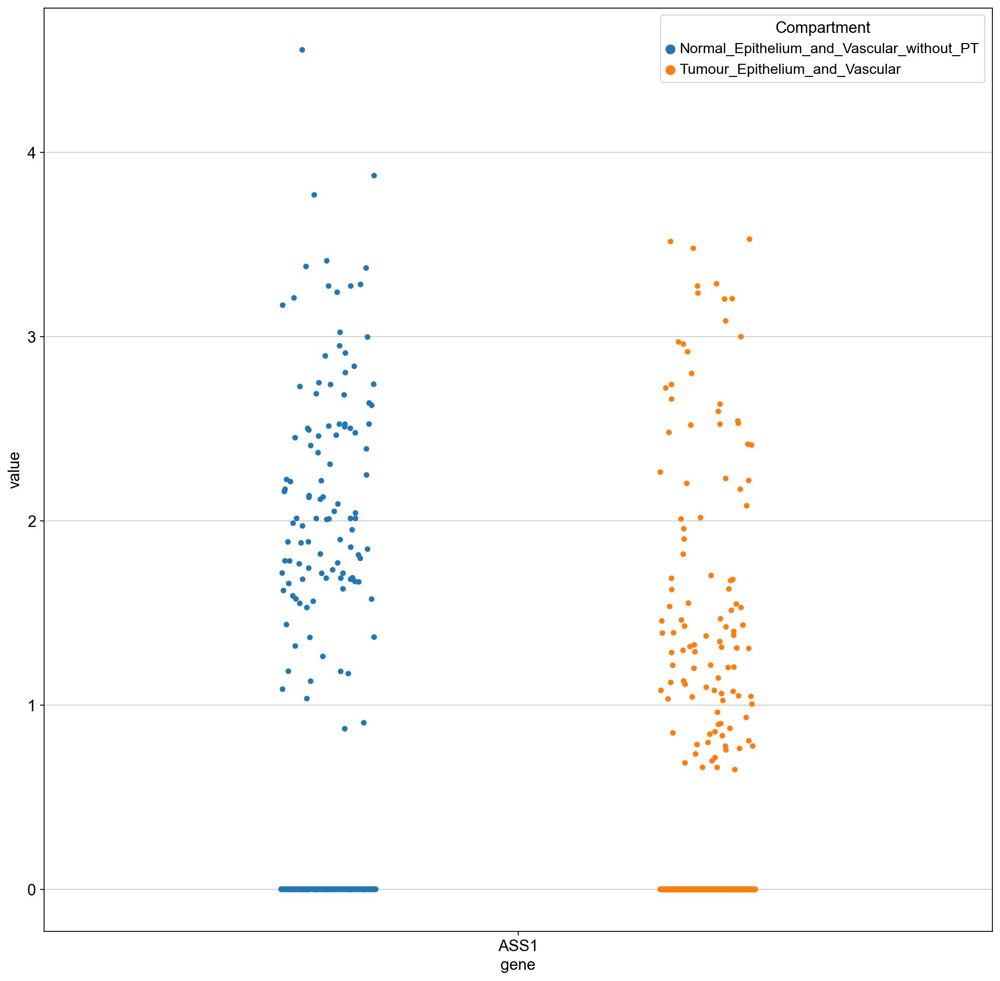

In [41]:
adata_filtered_patient_epith = adata_filtered_patient[np.isin(adata_filtered_patient.obs.Compartment, ['Normal_Epithelium_and_Vascular_without_PT','Tumour_Epithelium_and_Vascular'])].raw.to_adata()
df = sc.get.obs_df(adata_filtered_patient_epith, ['ASS1', 'Compartment'])
df = df.set_index('Compartment').stack().reset_index()
df.columns = ['Compartment', 'gene', 'value']
import seaborn as sns
#sns.violinplot(data=df, x='gene', y='value', hue="Compartment",
#                split=True, inner="quart", linewidth=1)  
sns.stripplot(data=df, x='gene', y='value', hue="Compartment",
                split=True)  

In [42]:
adata_filtered_patient.obs['ASS1_expressed'] = adata_filtered_patient.raw.to_adata()[:,'ASS1'].X.A >  1.5
adata_filtered_patient.obs['ASS1_expressed'] = adata_filtered_patient.obs['ASS1_expressed'].astype(str)

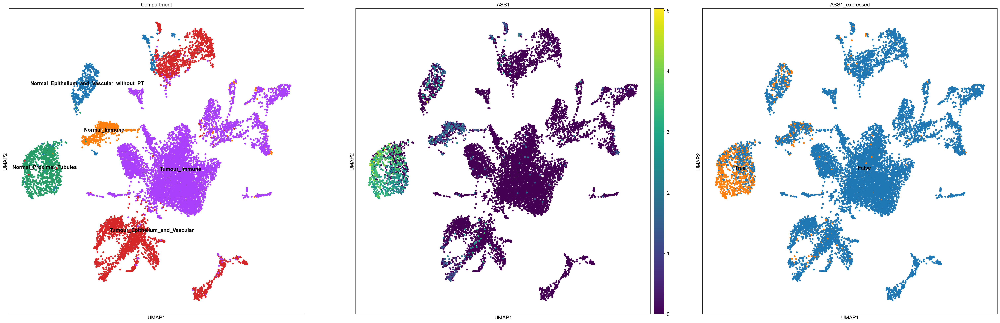

In [43]:
sc.pl.umap(adata_filtered_patient, color=['Compartment', 'ASS1','ASS1_expressed'], size=100, legend_loc='on data', )

In [45]:
adata.obs['is_tumor'] = np.isin(adata.obs.Compartment, ['Tumour_Immune','Tumour_Epithelium_and_Vascular'])
adata.obs['is_tumor'] = adata.obs['is_tumor'].astype(str)

In [46]:
adata.obs['Compartment'] = adata.obs['Compartment'].str.replace("Normal_","",regex = True)
adata.obs['Compartment'] = adata.obs['Compartment'].str.replace("Tumour_","",regex = True)
adata.obs['Compartment'] = adata.obs['Compartment'].str.replace("_without_PT","",regex = True)

In [98]:
adata.obs['ASS1_expressed'] = adata.raw.to_adata()[:,'ASS1'].X.A >  1.5
adata.obs['ASS1_expressed'] = adata.obs['ASS1_expressed'].astype(str)
adata.obs['Compartment_ASS1'] = adata.obs['Compartment'].astype(str) + "_ASS1_expresed_is_" + adata.obs['ASS1_expressed'].astype(str)

In [47]:
adata.obs['Compartment'].unique()

array(['Epithelium_and_Vascular', 'Immune', 'Proximal_Tubules'],
      dtype=object)

In [68]:
adata

AnnData object with n_obs × n_vars = 14814 × 4765
    obs: 'barcode', 'SangerID', 'ClusterID', 'Compartment', 'nUMI', 'nGenes', 'MTfrac', 'QCpass', 'Source', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'is_tumor'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Compartment_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [48]:
adata.layers

Layers with keys: counts

In [71]:
padata = dc.get_pseudobulk(adata, sample_col='Source', groups_col='Compartment', layer='counts', min_prop=0.05, min_smpls=1)

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/decoupler/utils_anndata.py:203: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  psbulk = AnnData(psbulk, obs=new_obs, var=new_var)


In [72]:
sc.pp.normalize_total(padata, target_sum=1e4)
sc.pp.log1p(padata)
padata

normalizing counts per cell
    finished (0:00:00)


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 35 × 3472
    obs: 'SangerID', 'Compartment', 'QCpass', 'Source', 'is_tumor'
    uns: 'log1p'

In [131]:
logFCs, pvals = dc.get_contrast(padata,
                                group_col='Compartment',
                                condition_col='is_tumor',
                                condition='True',
                                reference='False',
                                method='t-test'
                               )
logFCs

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


Skipping group "Proximal_Tubules" since condition "True" not in column "is_tumor".


,AP006222.2,HES4,ISG15,AGRN,TNFRSF18,TNFRSF4,FAM132A,ACAP3,CPTP,MXRA8,...,TRPM2,PTTG1IP,FAM207A,COL18A1,COL6A1,COL6A2,FTCD,S100B,AL592183.1,AC007325.4
Epithelium_and_Vascular,0.613975,0.374335,-0.332842,0.299694,0.0,1.049814,0.0,0.0,-0.832969,2.069736,...,0.0,-0.291265,1.126061,0.699535,-0.219978,1.238503,-5.40556,2.824934,-0.483405,-0.55394
Immune,-0.143486,-1.195635,-0.330265,0.0,1.470405,1.948553,0.0,-0.928518,0.0,0.0,...,1.532285,0.347125,0.123852,0.23198,1.177403,-0.891592,-5.959839,-0.990714,-0.229301,-0.674796


In [132]:
logFCs[logFCs.columns] = logFCs[logFCs.columns].apply(pd.to_numeric)

In [133]:
logFCs.values

array([[ 0.61397463,  0.37433505, -0.33284244, ...,  2.82493448,
        -0.48340499, -0.55393994],
       [-0.14348647, -1.19563544, -0.3302654 , ..., -0.99071419,
        -0.2293008 , -0.67479599]])

In [134]:
deg = dc.format_contrast_results(logFCs, pvals)
deg[deg["contrast"] == 'Epithelium_and_Vascular'].head(50)

,contrast,name,logFC,pval
1,Epithelium_and_Vascular,NDUFA4L2,9.675441,0.0
3,Epithelium_and_Vascular,CD68,5.374890,0.0
4,Epithelium_and_Vascular,NUPR1,3.096303,0.0
6,Epithelium_and_Vascular,RP11-798K3.2,3.148249,0.000001
8,Epithelium_and_Vascular,MAP3K7CL,4.525923,0.000001
9,Epithelium_and_Vascular,C8orf4,-4.470471,0.000001
10,Epithelium_and_Vascular,MIR210HG,3.859733,0.000001
12,Epithelium_and_Vascular,RP11-356J5.12,4.853344,0.000002
13,Epithelium_and_Vascular,GNG7,-2.806815,0.000002
14,Epithelium_and_Vascular,NNMT,5.728784,0.000002


In [76]:
deg[deg["name"] == "ASS1"]

,contrast,name,logFC,pval
72,Epithelium_and_Vascular,ASS1,-2.087314,0.000153
259,Immune,ASS1,-4.868311,0.002029


In [78]:
deg[deg["name"] == "BCAT1"]

,contrast,name,logFC,pval
501,Immune,BCAT1,1.613585,0.007516
6751,Epithelium_and_Vascular,BCAT1,0.0,1.0


In [110]:
deg[deg["name"] == "GLUL"]

,contrast,name,logFC,pval
1651,Epithelium_and_Vascular,GLUL,-0.743209,0.075129
3240,Immune,GLUL,0.190113,0.378176


In [138]:
# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=300)

# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=logFCs, net=progeny, source='source', target='target', weight='weight', )
pathway_acts

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Epithelium_and_Vascular,-0.707693,0.176828,0.031855,4.776238,0.268307,-0.370665,0.524252,-0.400176,0.716039,-0.063259,-2.797865,-0.580725,0.297175,0.906875
Immune,-0.275713,-0.032075,-0.340525,3.547448,1.281368,-0.120525,0.124793,0.114026,1.680650,0.433120,-1.419457,-0.561339,0.448164,0.803918


In [56]:
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
4195,p53,F5,2.397854,5.746843e-08
4196,p53,MKI67,-5.680340,5.758565e-08
4197,p53,THOC2,-2.108178,5.858359e-08
4198,p53,POLA1,-4.943873,5.911873e-08


In [81]:
# Retrieve DoRothEA gene regulatory network
dorothea = dc.get_dorothea()

# Infer pathway activities with mlm
tf_acts, tf_pvals = dc.run_mlm(mat=logFCs, net=dorothea, source='source', target='target', weight='weight')
tf_acts

  0%|          | 0.00/51.4M [00:00<?, ?B/s]

/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/omnipath/_core/requests/_request.py:39: FutureWarning: The squeeze argument has been deprecated and will be removed in a future version. Append .squeeze("columns") to the call to squeeze.


  res: pd.DataFrame = callback(*args, **kwargs)


TypeError: no supported conversion for types: (dtype('O'),)

In [119]:
padata_ASS1 = dc.get_pseudobulk(adata, sample_col='Source', groups_col='Compartment_ASS1', layer='counts', min_prop=0.05, min_smpls=1)
sc.pp.normalize_total(padata_ASS1, target_sum=1e4)
sc.pp.log1p(padata_ASS1)
padata_ASS1

normalizing counts per cell
    finished (0:00:00)


/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/decoupler/utils_anndata.py:203: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  psbulk = AnnData(psbulk, obs=new_obs, var=new_var)
/Users/aureliendugourd/opt/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 52 × 4053
    obs: 'SangerID', 'Compartment', 'QCpass', 'Source', 'is_tumor', 'ASS1_expressed', 'Compartment_ASS1'
    uns: 'log1p'

In [120]:
padata_ASS1.obs.Compartment_ASS1.unique()

array(['Epithelium_and_Vascular_ASS1_expresed_is_False',
       'Epithelium_and_Vascular_ASS1_expresed_is_True',
       'Immune_ASS1_expresed_is_False', 'Immune_ASS1_expresed_is_True',
       'Proximal_Tubules_ASS1_expresed_is_False',
       'Proximal_Tubules_ASS1_expresed_is_True'], dtype=object)

In [139]:
logFCs, pvals = dc.get_contrast(padata_ASS1,
                                group_col='is_tumor',
                                condition_col='Compartment_ASS1',
                                condition='Epithelium_and_Vascular_ASS1_expresed_is_True',
                                reference='Epithelium_and_Vascular_ASS1_expresed_is_False',
                                method='t-test'
                               )
logFCs

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


,AP006222.2,FAM41C,HES4,ISG15,AGRN,TNFRSF18,TNFRSF4,FAM132A,ACAP3,CPTP,...,FAM207A,COL18A1,COL6A1,COL6A2,FTCD,SPATC1L,S100B,AC011043.1,AL592183.1,AC007325.4
False,0.007364,0.0,-30.363365,-0.832573,0.218236,0.0,-28.960226,0.0,0.0,0.278059,...,-0.226724,-0.431412,-0.2556,-30.108658,1.124529,0.0,-24.343605,29.261204,0.719766,0.246272
True,-0.205997,0.0,-30.758904,-0.54509,-29.935829,29.110435,-30.347652,0.0,0.0,0.123062,...,0.489754,-2.497118,-0.691138,-31.25865,-24.391277,0.0,-26.954243,28.634207,-29.058884,1.096547


In [140]:
logFCs[logFCs.columns] = logFCs[logFCs.columns].apply(pd.to_numeric)

In [141]:
deg_ASS1 = dc.format_contrast_results(logFCs, pvals)
deg_ASS1[deg_ASS1["contrast"] == 'True'].head(50)

,contrast,name,logFC,pval
0,True,PHACTR1,-29.941156,0.0
1,True,GOSR2,-29.976879,0.0
2,True,ABHD11,-30.345949,0.000001
3,True,TMEM192,-30.371525,0.000002
4,True,TMEM120A,1.910723,0.000002
5,True,TACO1,-29.608528,0.000003
6,True,SEC24D,-29.649244,0.000004
7,True,LINC00467,-30.265038,0.000007
9,True,LRRC42,-29.615204,0.000007
10,True,LRP1,-29.917957,0.000011


In [142]:
# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=300)

# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=logFCs, net=progeny, source='source', target='target', weight='weight', )
pathway_acts

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
False,-0.397546,-2.641322,0.057717,-1.525136,-0.959805,1.232088,-0.943543,0.334000,-1.037059,-0.413430,0.939772,0.633600,0.105350,-1.028047
True,-1.105398,-2.440396,-1.970223,1.958679,0.327752,1.391987,0.854447,-1.083415,-1.283984,-0.932082,1.286764,-0.632865,-0.654019,0.259859


In [124]:
deg.to_csv(path_or_buf='../results/DA_tumorVsHealthy.csv')

In [125]:
deg_ASS1.to_csv(path_or_buf='../results/DA_ASS1vsNoASS1.csv')

In [ ]:
adata_filtered_patient.obs

In [ ]:
adata_filtered_patient[:,'ASS1'].X > 2